In [1]:
import ruptures as rpt
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pybedtools

In [11]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

#Scrip to remove artifacts.
import pandas as pd
import numpy as np
import pybedtools
import matplotlib.pyplot as plt

#Creates a bed file from an array
def create_bed_from_array(array):

    data_array = []
    if len(array) % 2 != 0:
        array=array[:-1] #Remove last value
    for i in range(0, len(array), 2):
        data_array.append(["PA_chr01", array[i],array[i+1]])
    np_array = np.array(data_array)
    dataframe = pd.DataFrame(np_array)
    return pybedtools.BedTool.from_dataframe(dataframe)

#Removes exact matches from an array
def remove_artifacts_exact(reference, individual):
    ref_set = set(ref)
    deletions = [x for x in ind1 if x not in ref_set]
    return deletions

#Removes matches in a window, w=1000 is the extension of the window.
def remove_artifacts_window(ref_bed, ind_bed):
    ind5_bkps_bed = pybedtools.BedTool(ind_bed)
    ref_bkps_bed = pybedtools.BedTool(ref_bed)
    return ind5_bkps_bed.window(ref_bkps_bed, w=10, v=True)

def bed_to_array(bed):
    # df=pd.read_csv('removed_artifacts_pred.bed',header=None, sep='\t')
    # col_one_arr = df[1].to_numpy()
    # col_two_arr = df[2].to_numpy()
    # start_stop=np.array([0,size])
    # arr = np.concatenate((col_one_arr, col_two_arr))
    # arr = np.concatenate((arr, start_stop))

    # arr=np.sort(arr)

    return pybedtools.BedTool.to_dataframe(bed).loc[:, ["start", "end"]].to_numpy().flatten()

#Filter and remove artifacts
def pred_breakpoints(ref_arr, pred_arr, coverage_array, thr):
        filter_arr=filter_coverage(pred_arr, thr, coverage_array) #Filter some threshold
        pred_filtred_bed=create_bed_from_array(filter_arr) #create bed file
        ref_bed=create_bed_from_array(ref_arr)
        rem_pred_filter=remove_artifacts_window(ref_bed,pred_filtred_bed)
        return pred_filtred_bed #rem_pred_filter #


def filter_coverage(pred_array, threshold, coverage_array):
    avg_cov_arr=[]
    pred_filterd=[]
    for i in range(len(pred_array)-1):
        start=pred_array[i]
        stop=pred_array[i+1]

        temp=coverage_array[start: stop]

        avg_coverage=sum(temp)/len(temp)
        if avg_coverage<threshold:
            pred_filterd.extend([start, stop])

        avg_cov_arr.append(avg_coverage)
    return pred_filterd


In [82]:
# Make a python function which can compare output from script to the given .bed files and calculate:

# Accuracy = (TP+TN)(/TN+FN+TP+FP)
# Sensitivity (True Positive Rate) = TP/(TP+FN)
# Specificity (True Positive Rate) = TN/(FP+TN)
# ROC-curve

# True Positive - A true deletion (found through script and bed file)
# False Positive - Script find deletion but not in bed file (over estimated)
# True Negative - Icke deletion (interval from deletion to deletion)
# False Negative - Script does not find true deletion (missed sites)

# Find the smallest deletion (true positive with the smallest length)

import pybedtools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def calc_acc_sens_spec(pred_bkps_bed, true_bkps_bed, lenght):
   # Compare 2 bed-files or two arrays or matrices
   # pred_bed is from our script
   # true_bed is bed-file with true deletions

   # pred_bkps_bed = pybedtools.BedTool(pred_bed)
   # true_bkps_bed = pybedtools.BedTool(true_bed)

    true_pos_bed= pred_bkps_bed.intersect(true_bkps_bed)
    false_pos_bed=pred_bkps_bed.subtract(true_bkps_bed)


    true_pos_arr=[]
    false_pos_arr=[]
    real_del=[]

    for feature in true_pos_bed:
        true_pos_arr.append(feature.stop-feature.start)
    for feature in false_pos_bed:
        false_pos_arr.append(feature.stop-feature.start)
    for feature in true_bkps_bed:
        real_del.append(feature.stop-feature.start)

   # True positives
    true_pos = sum(true_pos_arr)
   # False positives
    false_pos =  sum(false_pos_arr)
   # False negative
    false_neg = sum(real_del)- sum(true_pos_arr)#Real deletions - true positives
   # True negative
    true_neg = lenght - sum(false_pos_arr) - false_neg - sum(true_pos_arr)


    accuracy = (true_pos + true_neg)/(true_neg + false_neg + true_pos + false_pos)
    sensitivity = true_pos/(true_pos + false_neg)
    specificity = true_neg/(true_neg + false_pos)

    return accuracy, sensitivity, specificity

def over_estimated_sites(true_del, false_pos):
    over_est_sites = []
    real_del=[]
    # Loop through size/number of true deletions
    for i in range(true_del.shape[0]):
        real_del.append(true_del.loc[i,"end"]-true_del.loc[i,"start"])
        left_over_est = 0 # Over estimation to the left of the deletion
        right_over_est = 0 # Over estimation to the right of the deletion
        # Loop through all false positives
        for j in range(false_pos.shape[0]):
            # Left side match
            if false_pos.loc[j,"end"] == true_del.loc[i,"start"]:
                left_over_est = false_pos.loc[j,"end"]-false_pos.loc[j,"start"]
            # Right side match
            elif false_pos.loc[j,"start"] == true_del.loc[i,"end"]:
                right_over_est = false_pos.loc[j,"end"]-false_pos.loc[j,"start"]
        over_est_sites.append(left_over_est + right_over_est) # Append number of over estimated sites

    fractions = [(i / j)*100 for i, j in zip(over_est_sites, real_del)]
    my_labels = {"x1" : "Nothing over estimated", "x2" : "Completly over estimated", "x3":"Partly over estimated"}

    for k in range(len(fractions)):
        if fractions[k]==0:
            plt.scatter(real_del[k], fractions[k], c="g", label=my_labels["x1"])
            my_labels["x1"] = "_nolegend_"
        elif fractions[k]==100:
            plt.scatter(real_del[k], fractions[k], c="r", label=my_labels["x2"])
            my_labels["x2"] = "_nolegend_"
        else:
            plt.scatter(real_del[k], fractions[k], c="b", label=my_labels["x3"])
            my_labels["x3"] = "_nolegend_"


    plt.title("Percentage Over Estimated Sites")
    plt.xlabel("Size of deletion")
    plt.ylabel("% over estimated sites")
    plt.legend()
    plt.grid()
    plt.show()
    return fractions

#uses bedfile to dataframe
def under_estimated_sites(true_del, true_pos):
    missed_sites = []
    real_del=[]
    for i in range(true_del.shape[0]):
        real_del.append(true_del.loc[i,"end"]-true_del.loc[i,"start"])
        if true_del.loc[i,"name"]==0:
            missed_sites.append(true_del.loc[i,"end"]-true_del.loc[i,"start"])
        else:
            j = 0
            while true_pos.loc[j,"start"] < true_del.loc[i,"end"]:
                j=j+1
                if j >= true_pos.shape[0]:
                    break
            missed_sites.append(true_pos.loc[j-1,"start"]-true_del.loc[i,"start"] + true_del.loc[i,"end"]-true_pos.loc[j-1,"end"])

    fractions = [(i / j)*100 for i, j in zip(missed_sites, real_del)]
    my_labels = {"x1" : "Completly missed", "x2" : "Nothing missed", "x3":"Partly missed"}

    for k in range(len(fractions)):
        if fractions[k]==100:
            plt.scatter(real_del[k], fractions[k], c="r", label=my_labels["x1"])
            my_labels["x1"] = "_nolegend_"
            print(":()")
        elif fractions[k]==0:
            plt.scatter(real_del[k], fractions[k], c="g", label=my_labels["x2"])
            my_labels["x2"] = "_nolegend_"
        else:
            plt.scatter(real_del[k], fractions[k], c="b", label=my_labels["x3"])
            my_labels["x3"] = "_nolegend_"
    plt.title("Percentage Under Estimated Sites")
    plt.xlabel("Size of deletion")
    plt.ylabel("% missed sites")
    plt.legend()
    plt.grid()
    plt.show()
    return fractions


def roc_curve(avg_coverage, pred_array, true_del_bed, coverage_array, ref_arr, lenght):

    threshold = np.linspace(0, 0.5*avg_coverage,70)
    acc_arr = []
    spec_arr = []
    sens_arr = []
    for thr in threshold:
        # filter_arr=filter_coverage(pred_array, thr, coverage_array) #Filter some threshold
        #
        # pred_filtred_bed=create_bed_from_array(filter_arr) #create bed file
        # ref_bed=create_bed_from_array(ref_arr)
        # rem_pred_filter=remove_artifacts_window(ref_bed,pred_filtred_bed)
        rem_pred_filter=pred_breakpoints(ref_arr, pred_array, coverage_array, thr)
        accuracy, sensitivity, specificity  = calc_acc_sens_spec(rem_pred_filter, true_del_bed, lenght)
        acc_arr.append(accuracy)
        spec_arr.append(specificity)
        sens_arr.append(sensitivity)

    # print("Sensitivity: ")
    # print(sens_arr)
    # print("specificity")
    # print(spec_arr)
    # print("accuracy")
    # print(acc_arr)
    plt.figure(1)
    fpr=1-np.array(spec_arr)
    plt.plot(fpr, sens_arr)
    plt.title("ROC curve - coverage filtering thresholds ")
    plt.xlabel("False positive rate")
    plt.ylabel("Sensitivity")
    same=[]
    # returns the unique values, the index of the first occurrence of a value, and the count for each element
    vals, idx_start, count = np.unique(fpr, return_counts=True, return_index=True)
    idx_sort = np.argsort(fpr)
    # splits the indices into separate arrays
    res = np.split(idx_sort, idx_start[1:])

    for p in res:
        max_p=max(p)
        min_p=min(p)
        if max_p==min_p:
            plt.annotate(round(threshold[min_p], 4), xy=(fpr[min_p],sens_arr[min_p]))
        else:
            plt.annotate(round(threshold[min_p], 4), xy=(fpr[min_p],sens_arr[min_p]))
            plt.annotate(round(threshold[max_p], 4), xy=(fpr[max_p],sens_arr[max_p]-0.05))
    plt.grid()
    #plt.plot(threshold, acc_arr)
    plt.show()


In [37]:
def extract_data(path, row): 
    data=pd.read_csv(path, header=None, sep='\t')
    #Extract the individual sample
    individual=np.array(data[row])

    #Extract the reference
    reference=np.array(data[2])
    return individual, reference 

In [24]:
def window(individual, reference, pen_ind, pen_ref, width, min_size): 

    #Define the model and algoritm
    model = "l2"  # "l1", "rbf", "linear", "normal", "ar"

    #Fit the data - uncommet this to try different models
    algo = rpt.Window(width=width, model=model, min_size=min_size).fit(individual)
    algo_ref = rpt.Window(width=width, model=model, min_size=min_size).fit(reference)

    #Predict the breakpoints for the individual and reference
    ind_bkps = algo.predict(pen=pen_ind) #- uncommet this to try different penalties etc
    ref_bkps = algo_ref.predict(pen=pen_ref) #- uncommet this to try different models
    return ind_bkps, ref_bkps

In [49]:
# Show the data
def display_data(individual, ind_bkps, reference, ref_bkps):
    rpt.display(individual, ind_bkps, figsize=(100, 6))
    plt.title('Before filtering and artifacts removal')
    plt.show()

    #Show the reference 
    rpt.display(reference, ref_bkps, figsize=(100, 6))
    plt.title('Reference')
    plt.show()

In [67]:
def display_filtered(ref_bkps , ind_bkps, individual, threshold): 
    rem_pred_filter=pred_breakpoints(ref_bkps , ind_bkps, individual, threshold)
    rem_pred_filter_arr=bed_to_array(rem_pred_filter)
    true_bkps_arr=bed_to_array(true_bkps_bed)
    rpt.display(individual, rem_pred_filter_arr, figsize=(100, 6))
    plt.title('After filtering')
    plt.show()
    return rem_pred_filter
  

In [68]:
def display_over_under_est(true_bkps_bed, rem_pred_filter, length):
    true_del_with_matches_df = true_bkps_bed.intersect(rem_pred_filter, c=True).to_dataframe()
    false_pos_df=rem_pred_filter.subtract(true_bkps_bed).to_dataframe()
    true_pos_df=rem_pred_filter.intersect(true_bkps_bed).to_dataframe()

    #Under estimated
    under_estimated_sites(true_del_with_matches_df, true_pos_df)
    plt.show()
    #Over estimated
    over_estimated_sites(true_del_with_matches_df, false_pos_df)
    plt.show()
    print("accuracy, sensitivity, specificity")
    print(calc_acc_sens_spec(rem_pred_filter, true_bkps_bed, length))


In [52]:
#1 million 100x
#Define the dataset and individual
individual, reference=extract_data('/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/Simulated_data/1mil_100x', 5)

#Read the true deletions as a BED file
true_bkps_bed = pybedtools.BedTool("/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/applied_bioinformatics/1mil_C.bed")


In [5]:
#300k - 100x
#Define the dataset and individual
individual, reference=extract_data('/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/Simulated_data/300k_100x', 5)

#Read the true deletions as a BED file
true_bkps_bed = pybedtools.BedTool("/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/applied_bioinformatics/300k_C.bed")


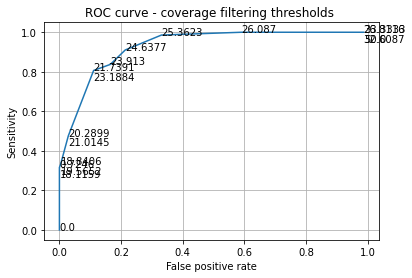

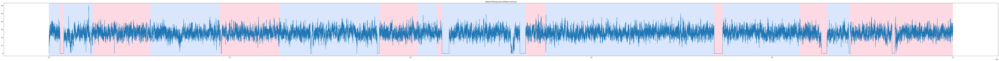

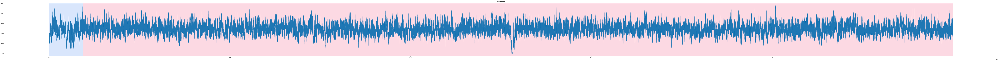

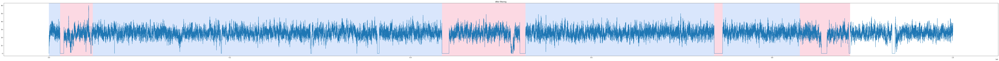

:()
:()
:()
:()


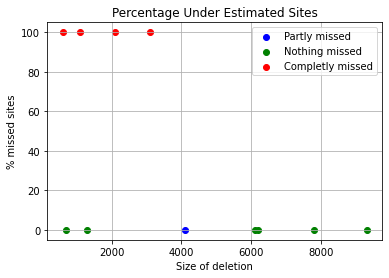

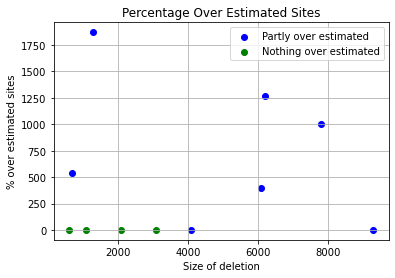

accuracy, sensitivity, specificity
(0.835096, 0.8372169811320754, 0.8350020885547201)


In [83]:
#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 10**3, 10**3, 100, 100)

#Display and filter 
roc_curve(100, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 24)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

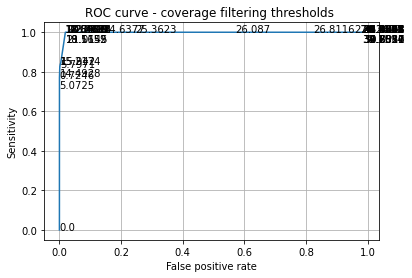

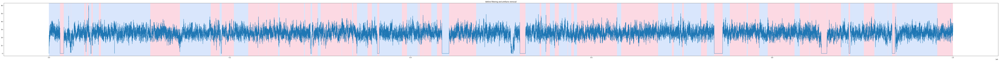

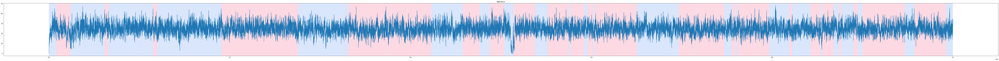

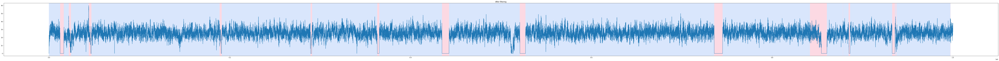

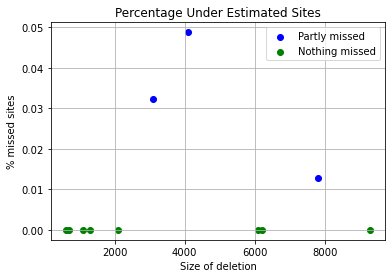

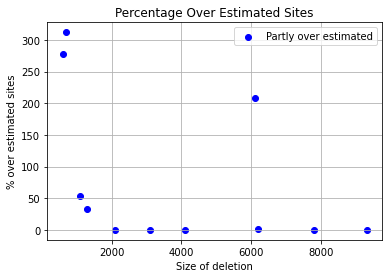

accuracy, sensitivity, specificity
(0.978797, 0.9999056603773585, 0.9778623642439432)


In [84]:
#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 10, 10, 100, 100)

#Display and filter 
roc_curve(100, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 20)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

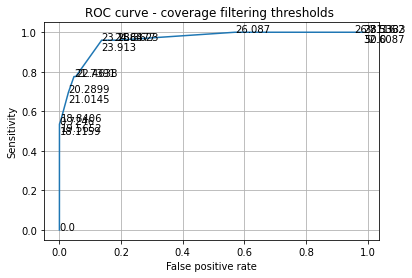

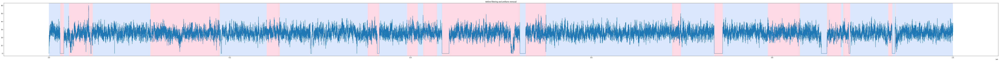

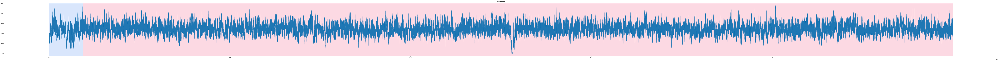

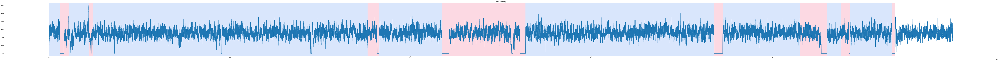

:()
:()


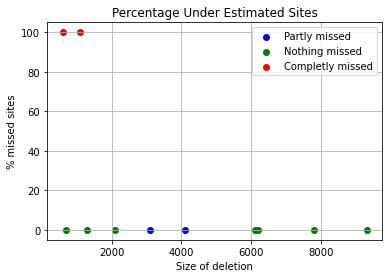

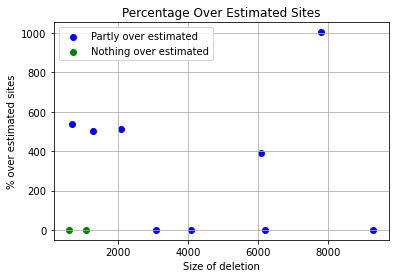

accuracy, sensitivity, specificity
(0.867049, 0.9598349056603773, 0.8629406850459482)


In [85]:
#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 100, 10**4, 100, 100)

#Display and filter 
roc_curve(100, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 24)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

In [86]:
#Extract data 
individual, reference = extract_data('/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/Simulated_data/1mil_50x', 5) 

#Read the true deletions as a BED file
true_bkps_bed = pybedtools.BedTool("/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/applied_bioinformatics/1mil_C.bed")


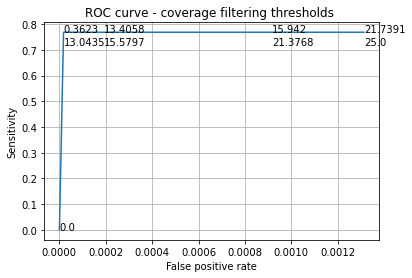

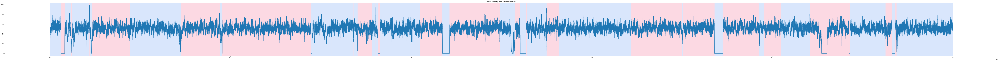

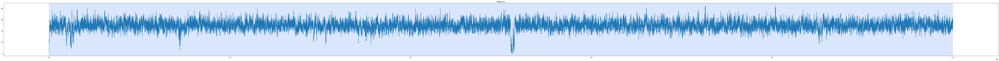

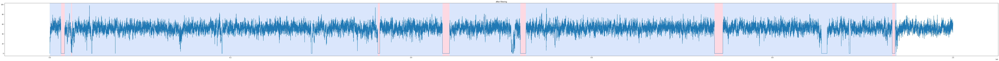

:()
:()
:()
:()
:()


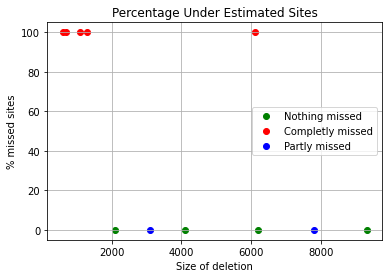

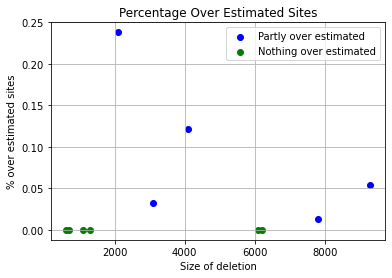

accuracy, sensitivity, specificity
(0.989321, 0.7688207547169811, 0.9990841687552214)


In [87]:

#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 10, 1000, 100, 100)

#Display and filter 
roc_curve(50, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 20)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

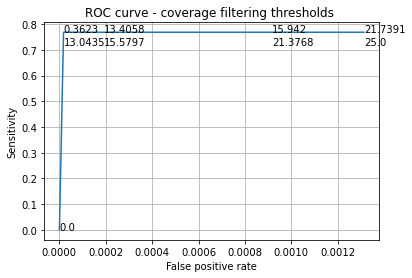

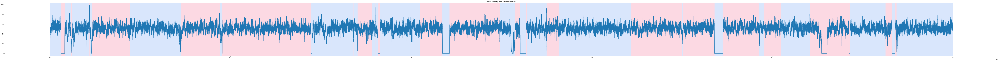

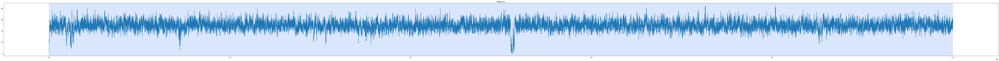

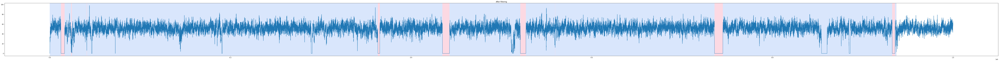

:()
:()
:()
:()
:()


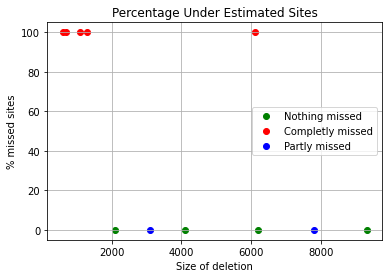

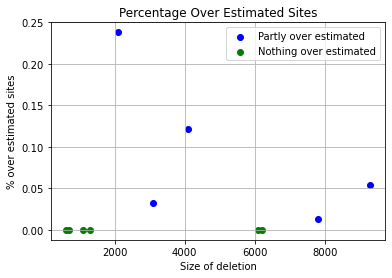

accuracy, sensitivity, specificity
(0.988941, 0.7688207547169811, 0.998687343358396)


In [88]:

#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 5, 1000, 100, 100)

#Display and filter 
roc_curve(50, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 25)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

In [89]:
#Extract data 25K
individual, reference = extract_data('/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/Simulated_data/1mil_25x', 5) 

#Read the true deletions as a BED file
true_bkps_bed = pybedtools.BedTool("/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/applied_bioinformatics/1mil_C.bed")


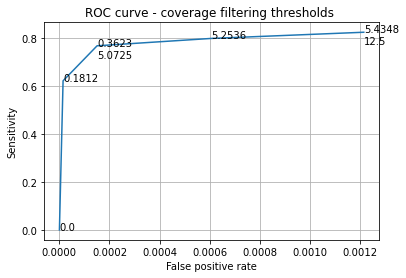

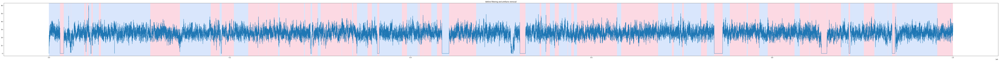

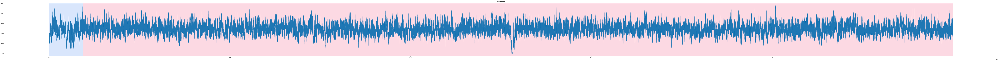

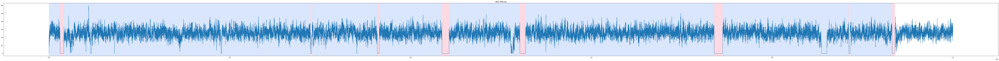

:()
:()
:()


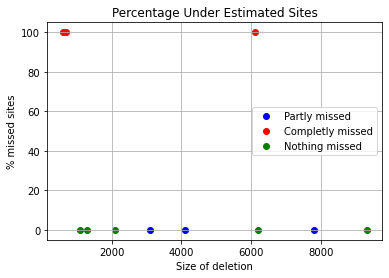

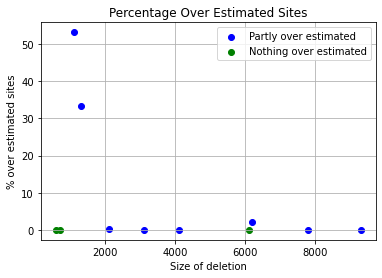

accuracy, sensitivity, specificity
(0.991432, 0.825377358490566, 0.9987844611528822)


In [90]:

#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 10, 1000, 100, 100)


#Display and filter 
roc_curve(25, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)
display_data(individual, ind_bkps, reference, ref_bkps)
rem_pred_filter=display_filtered(ref_bkps , ind_bkps, individual, 6)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)

With remove artefacts - some deletions gets removed. 

PELT - very slow :(

In [6]:
#Binseg

#Define the model and algoritm
model = "l2"  # "l1", "rbf", "linear", "normal", "ar"
min_size=100 #Minimum size between the deletions

#Fit the data - uncommet this to try different models
algo = rpt.Binseg(model=model, min_size=min_size, jump=10).fit(individual)
algo_ref = rpt.Binseg(model=model, min_size=min_size).fit(reference)

#Predict the breakpoints for the individual and reference
ind_bkps = algo.predict(pen=10**5) #- uncommet this to try different penalties etc
ref_bkps = algo_ref.predict(pen=10**5) #- uncommet this to try different models


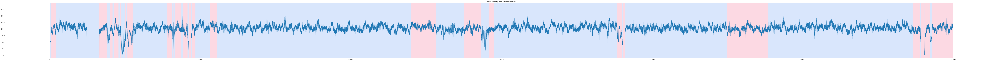

[430, 2030, 12260, 12370, 16430, 19150, 19870, 20820, 21370, 22820, 23200, 23600, 24260, 24420, 24890, 25190, 25660, 27760, 38830, 40520, 40920, 41080, 41520, 43500, 43870, 44060, 44320, 45750, 46130, 46950, 47290, 48380, 53130, 55470, 119990, 128220, 137460, 143320, 145940, 147490, 188410, 190140, 190390, 191080, 225010, 238460, 286660, 289060, 289400, 290580, 290690, 292460, 293100, 300000]


In [7]:
# Show the data

rpt.display(individual, ind_bkps, figsize=(100, 6))
plt.title('Before filtering and artifacts removal')
plt.show()

print(ind_bkps)

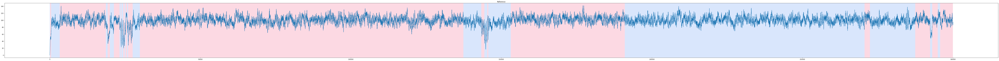

In [8]:
#Show the reference 
rpt.display(reference, ref_bkps, figsize=(100, 6))
plt.title('Reference')
plt.show()

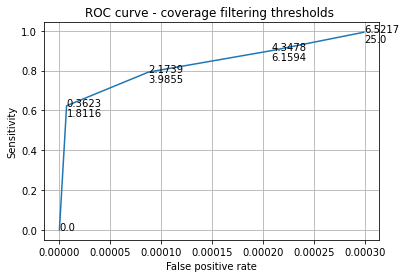

In [16]:
roc_curve(100, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)



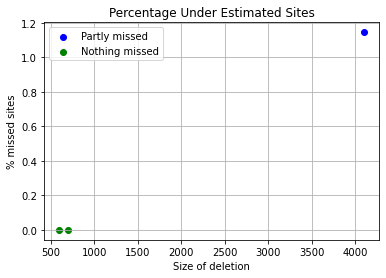

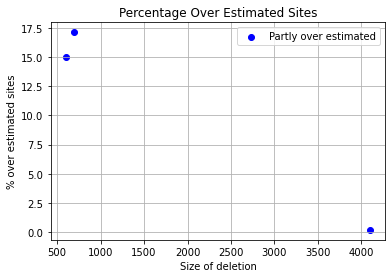

accuracy, sensitivity, specificity
(0.999656, 0.9927692307692307, 0.9997010568696527)


In [17]:

rem_pred_filter=pred_breakpoints(ref_bkps , ind_bkps, individual, 20)
rem_pred_filter_arr=bed_to_array(rem_pred_filter)
true_bkps_arr=bed_to_array(true_bkps_bed)

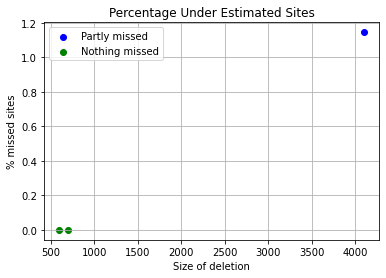

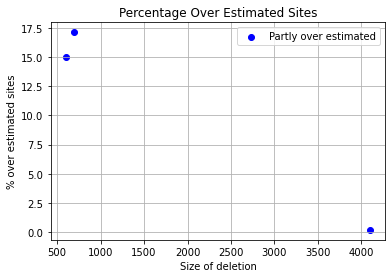

accuracy, sensitivity, specificity
(0.999656, 0.9927692307692307, 0.9997010568696527)


In [21]:
true_del_with_matches_df = true_bkps_bed.intersect(rem_pred_filter, c=True).to_dataframe()
false_pos_df=rem_pred_filter.subtract(true_bkps_bed).to_dataframe()
true_pos_df=rem_pred_filter.intersect(true_bkps_bed).to_dataframe()

#Under estimated
under_estimated_sites(true_del_with_matches_df, true_pos_df)

#Over estimated
over_estimated_sites(true_del_with_matches_df, false_pos_df)
print("accuracy, sensitivity, specificity")
print(calc_acc_sens_spec(rem_pred_filter, true_bkps_bed, 1000000))

Text(0.5, 1.0, 'After filtering')

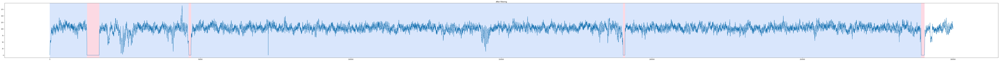

In [18]:
rpt.display(individual, rem_pred_filter_arr, figsize=(100, 6))
plt.title('After filtering')
# plt.show()

In [25]:
ind_bkps, ref_bkps= window(individual, reference, 1000, 1000, 100, 100)

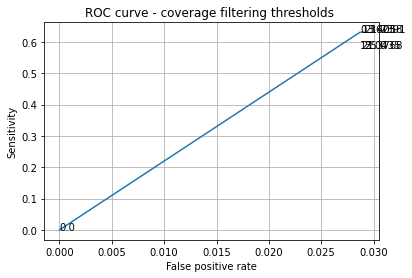

In [27]:
roc_curve(100, ind_bkps, true_bkps_bed, individual, ref_bkps, 1000000)

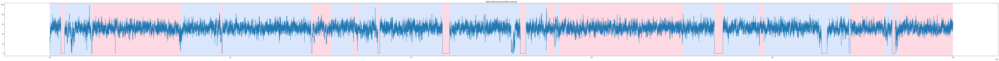

[12320, 16425, 40910, 41105, 43900, 44015, 46900, 144845, 188780, 191035, 289390, 311930, 336435, 340700, 360365, 360515, 363240, 365345, 434770, 442570, 520990, 527190, 549750, 549930, 550145, 559635, 563970, 701305, 735940, 745245, 785720, 790855, 860650, 860800, 876235, 876385, 886290, 925365, 932750, 935850, 936635, 936780, 937270, 937435, 938435, 1000000]


In [26]:
# Show the data

rpt.display(individual, ind_bkps, figsize=(100, 6))
plt.title('Before filtering and artifacts removal')
plt.show()

print(ind_bkps)

#Show the reference 
rpt.display(reference, ref_bkps, figsize=(100, 6))
plt.title('Reference')
plt.show()

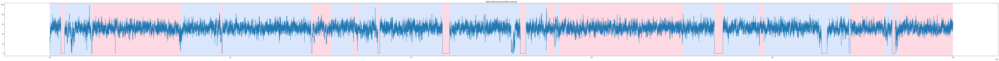

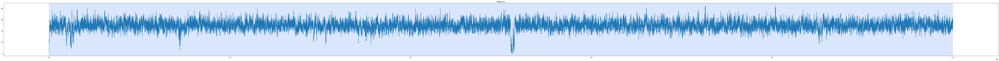

In [32]:
display_data(individual, ind_bkps, reference, ref_bkps)

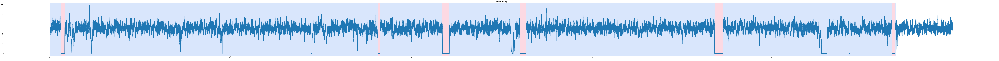

In [36]:
display_filtered(ref_bkps , ind_bkps, individual, 20)

:()
:()


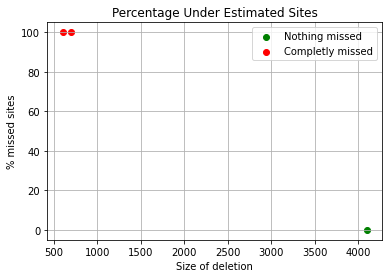

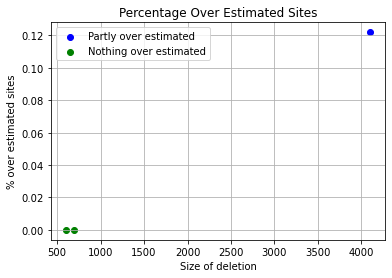

accuracy, sensitivity, specificity
(0.96892, 0.6307692307692307, 0.9711323603422245)


In [29]:
def display_over_under_est():
    true_del_with_matches_df = true_bkps_bed.intersect(rem_pred_filter, c=True).to_dataframe()
    false_pos_df=rem_pred_filter.subtract(true_bkps_bed).to_dataframe()
    true_pos_df=rem_pred_filter.intersect(true_bkps_bed).to_dataframe()

    #Under estimated
    under_estimated_sites(true_del_with_matches_df, true_pos_df)

    #Over estimated
    over_estimated_sites(true_del_with_matches_df, false_pos_df)
    print("accuracy, sensitivity, specificity")
    print(calc_acc_sens_spec(rem_pred_filter, true_bkps_bed, 1000000))

Text(0.5, 1.0, 'After filtering')

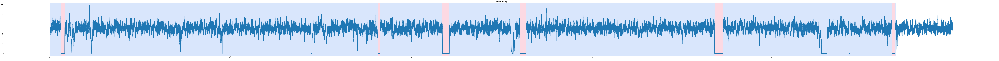

In [30]:
rpt.display(individual, rem_pred_filter_arr, figsize=(100, 6))
plt.title('After filtering')
# plt.show()

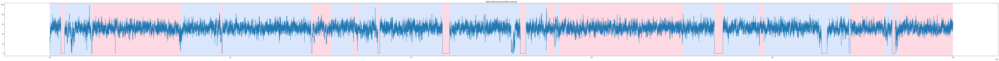

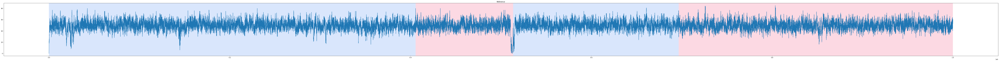

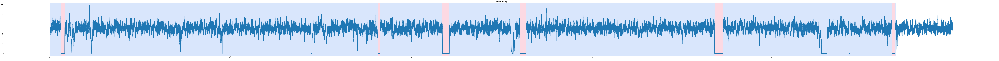

:()
:()
:()
:()
:()


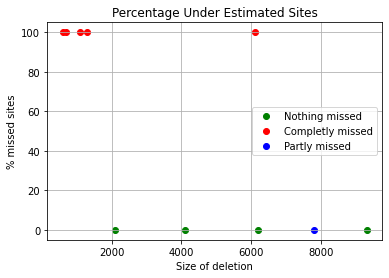

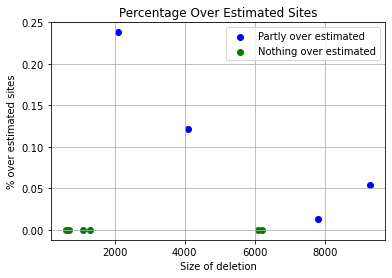

accuracy, sensitivity, specificity
(0.990016, 0.7688207547169811, 0.9998099415204679)


In [51]:
#Extract data 
#individual, reference = extract_data('/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/Simulated_data/1mil_50x', 5) 

#Read the true deletions as a BED file
#true_bkps_bed = pybedtools.BedTool("/Users/linnbeckman/OneDrive/Uppsala Universitet_OneDrive/project_bioinf/applied_bioinformatics/1mil_C.bed")

#Calculate break points
ind_bkps, ref_bkps=window(individual, reference, 100, 10, 100, 100)

#Display and filter 
display_data(individual, ind_bkps, reference, ref_bkps)
display_filtered(ref_bkps , ind_bkps, individual, 20)
display_over_under_est(true_bkps_bed, rem_pred_filter, 1000000)